# <center> Capital One NYC Green Taxi Data Challenge</center>
Initial: **YH**<br>
Workday ID：**C1127615** <br>
Data Science **Intern** Candidate<br>
03/18/2019

![green1.jpg](green1.jpg)

This notebook answers all five required questions of the Capital One Data Science Challenge. It performs Exploratory Data Analysis for New York City Green Taxi dataset, builds predictive model for Tip percentage of NYC Green Taxi Trips, as well as plots visulization to understand NYC Green Taxi Traffic. <br>
<br>The dataset is NYC Taxi and Limousine trip record data, and the Green Taxis data for the month of 09/2015 are used. 

In [49]:
import pandas as pd
import numpy as np
import datetime

import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split 
from feature_selector import FeatureSelector
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn import preprocessing
from sklearn import utils
from shapely.geometry import Point,Polygon,MultiPoint,MultiPolygon

import matplotlib  
import matplotlib.pyplot as plt 
from matplotlib import rcParams 
plt.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')

Note: this notebook requires FeatureSelector packages download and installed from https://github.com/WillKoehrsen/feature-selector

# Table of Contents
This notebook contains the following sections:
1. <a href = '#Q1'>Question 1</a>
2. <a href = '#Q2'>Question 2</a>
3. <a href = '#Q3'>Question 3</a>
4. <a href = '#Q4'>Question 4</a>
5. <a href = '#Q5'>Question 5</a>

<a id="Q1"></a>
### Question 1
* Programmatically download and load into your favorite analytical tool the trip data for September 2015.<br>

* Report how many rows and columns of data you have loaded.

#### Load the Data

In [2]:
#Download the data
data = pd.read_csv('https://s3.amazonaws.com/nyc-tlc/trip+data/green_tripdata_2015-09.csv')

In [3]:
#Print the head the data to have an overview of the data
data.head()

,VendorID,lpep_pickup_datetime,Lpep_dropoff_datetime,Store_and_fwd_flag,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,...,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type
0,2,2015-09-01 00:02:34,2015-09-01 00:02:38,N,5,-73.979485,40.684956,-73.979431,40.685020,1,...,7.8,0.0,0.0,1.95,0.0,NaN,0.0,9.75,1,2.0
1,2,2015-09-01 00:04:20,2015-09-01 00:04:24,N,5,-74.010796,40.912216,-74.010780,40.912212,1,...,45.0,0.0,0.0,0.00,0.0,NaN,0.0,45.00,1,2.0
2,2,2015-09-01 00:01:50,2015-09-01 00:04:24,N,1,-73.921410,40.766708,-73.914413,40.764687,1,...,4.0,0.5,0.5,0.50,0.0,NaN,0.3,5.80,1,1.0
3,2,2015-09-01 00:02:36,2015-09-01 00:06:42,N,1,-73.921387,40.766678,-73.931427,40.771584,1,...,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0
4,2,2015-09-01 00:00:14,2015-09-01 00:04:20,N,1,-73.955482,40.714046,-73.944412,40.714729,1,...,5.0,0.5,0.5,0.00,0.0,NaN,0.3,6.30,2,1.0


In [4]:
#check for attributes
data.columns

Index(['VendorID', 'lpep_pickup_datetime', 'Lpep_dropoff_datetime',
       'Store_and_fwd_flag', 'RateCodeID', 'Pickup_longitude',
       'Pickup_latitude', 'Dropoff_longitude', 'Dropoff_latitude',
       'Passenger_count', 'Trip_distance', 'Fare_amount', 'Extra', 'MTA_tax',
       'Tip_amount', 'Tolls_amount', 'Ehail_fee', 'improvement_surcharge',
       'Total_amount', 'Payment_type', 'Trip_type '],
      dtype='object')

In [5]:
#Check out the statistics of the data 
data.describe()

,VendorID,RateCodeID,Pickup_longitude,Pickup_latitude,Dropoff_longitude,Dropoff_latitude,Passenger_count,Trip_distance,Fare_amount,Extra,MTA_tax,Tip_amount,Tolls_amount,Ehail_fee,improvement_surcharge,Total_amount,Payment_type,Trip_type
count,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,1.494926e+06,0.0,1.494926e+06,1.494926e+06,1.494926e+06,1.494922e+06
mean,1.782045e+00,1.097653e+00,-7.383084e+01,4.069114e+01,-7.383728e+01,4.069291e+01,1.370598e+00,2.968141e+00,1.254320e+01,3.512800e-01,4.866408e-01,1.235727e+00,1.231047e-01,NaN,2.920991e-01,1.503215e+01,1.540559e+00,1.022353e+00
std,4.128570e-01,6.359437e-01,2.776082e+00,1.530882e+00,2.677911e+00,1.476698e+00,1.039426e+00,3.076621e+00,1.008278e+01,3.663096e-01,8.504473e-02,2.431476e+00,8.910137e-01,NaN,5.074009e-02,1.155316e+01,5.232935e-01,1.478288e-01
min,1.000000e+00,1.000000e+00,-8.331908e+01,0.000000e+00,-8.342784e+01,0.000000e+00,0.000000e+00,0.000000e+00,-4.750000e+02,-1.000000e+00,-5.000000e-01,-5.000000e+01,-1.529000e+01,NaN,-3.000000e-01,-4.750000e+02,1.000000e+00,1.000000e+00
25%,2.000000e+00,1.000000e+00,-7.395961e+01,4.069895e+01,-7.396782e+01,4.069878e+01,1.000000e+00,1.100000e+00,6.500000e+00,0.000000e+00,5.000000e-01,0.000000e+00,0.000000e+00,NaN,3.000000e-01,8.160000e+00,1.000000e+00,1.000000e+00
50%,2.000000e+00,1.000000e+00,-7.394536e+01,4.074674e+01,-7.394504e+01,4.074728e+01,1.000000e+00,1.980000e+00,9.500000e+00,5.000000e-01,5.000000e-01,0.000000e+00,0.000000e+00,NaN,3.000000e-01,1.176000e+01,2.000000e+00,1.000000e+00
75%,2.000000e+00,1.000000e+00,-7.391748e+01,4.080255e+01,-7.391013e+01,4.079015e+01,1.000000e+00,3.740000e+00,1.550000e+01,5.000000e-01,5.000000e-01,2.000000e+00,0.000000e+00,NaN,3.000000e-01,1.830000e+01,2.000000e+00,1.000000e+00
max,2.000000e+00,9.900000e+01,0.000000e+00,4.317726e+01,0.000000e+00,4.279934e+01,9.000000e+00,6.031000e+02,5.805000e+02,1.200000e+01,5.000000e-01,3.000000e+02,9.575000e+01,NaN,3.000000e-01,5.813000e+02,5.000000e+00,2.000000e+00


#### Report the dimension

In [6]:
#Check the number of rows and columns of the dataframe
data.shape

(1494926, 21)

There are 1,494,926 rows and 21 columns of the data I have loaded. 

In [7]:
#Let's make a copy of original dataset to green_temp for use in analysis in the following steps. 
green_temp = data.copy()

<a id="Q2"></a>

### Question 2
* Plot a histogram of the number of the trip distance (“Trip Distance”).<br>

* Report any structure you find and any hypotheses you have about that structure.

In [8]:
#Diaplay the statistics of column Trip_distance
green_temp["Trip_distance"].describe()

count    1.494926e+06
mean     2.968141e+00
std      3.076621e+00
min      0.000000e+00
25%      1.100000e+00
50%      1.980000e+00
75%      3.740000e+00
max      6.031000e+02
Name: Trip_distance, dtype: float64

In [9]:
#Set my plot to bigger size
# Get current size
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 9
fig_size[1] = 6
plt.rcParams["figure.figsize"] = fig_size

#### Trip Distance Histogram

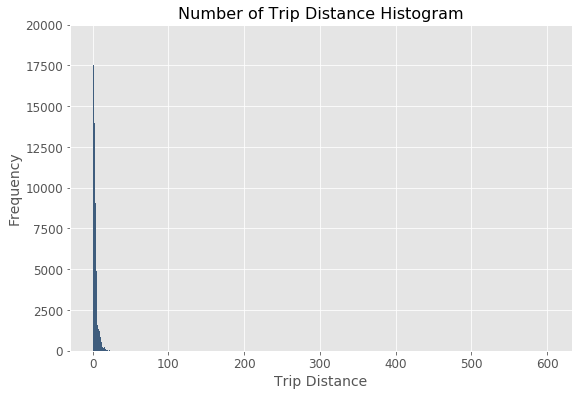

In [10]:
# Plot a histogram of the number of the trip distance
n, bins, patches = plt.hist(x= green_temp["Trip_distance"], bins = 'auto', color='#3F5D7D')
plt.rcParams['figure.figsize'] = (9, 6)
plt.xlabel('Trip Distance', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12) 
plt.title("Number of Trip Distance Histogram", fontsize=16)
#set a lean upper y-axis limit. 
plt.ylim(ymax=20000)
plt.show()

In [11]:
plt.cla()
plt.clf()
plt.close()

From the histogram above, we can see that data skewed right and have a Heavy-tailed distribution. This distribution makes the plot not that visually informative, as the frequency of trip distance greater than 20 almost empty on the plot. So we check and count the number of the trip distance greater than 20. 

In [12]:
dist20plus=[]
for y in green_temp['Trip_distance']:
    if y > 20:
        dist20plus.append(y)

len(dist20plus)/len(green_temp)

0.002250278609108411

In [13]:
1-len(dist20plus)/len(green_temp)

0.9977497213908916

The trip distance greater than 20 make up only 0.225% of the dataset, which lies outside the  99.7% interval of the dataset, according to the 6-sigma theory, we can trade them as outliers and remove them from our dataset to plot the histogram again.

In [16]:
data_distless20 = green_temp[green_temp['Trip_distance'] <= 20]
#check the statistics of the data with trip distance less or euqal to 20.
data_distless20['Trip_distance'].describe()

count    1.491562e+06
mean     2.916456e+00
std      2.807203e+00
min      0.000000e+00
25%      1.090000e+00
50%      1.970000e+00
75%      3.720000e+00
max      2.000000e+01
Name: Trip_distance, dtype: float64

Plot the histogram again,

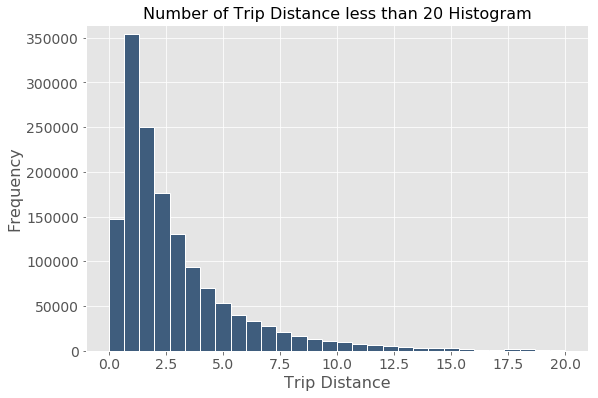

In [17]:
n, bins, patches = plt.hist(x= data_distless20['Trip_distance'], bins = 30, \
                            color='#3F5D7D', edgecolor='white', linewidth=1)

plt.xlabel('Trip Distance', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 
plt.title("Number of Trip Distance less than 20 Histogram", fontsize=16)  

#set a lean upper y-axis limit. 
plt.ylim(ymax=n.max()+10000)
plt.show()

#### Finding on Trip Distance Histogram:
1. The histogram is right skewed, and thus has a mean greater than its median.
2. The frequency of Trip distance is high around 1.5 miles and then decreases exponentially.
3. Frequency of trip distance greater than 10 miles is very low as compared to frequency of trip distance up to 5 miles.

#### Hypothesis:
1. Since the histogram has a right skewed distribution rather than a (symmetric) Gaussian distribution, the trips are not random.
2. We notice a great number of trips with distance equal to zero. One possible explanation I can imagine is that maybe some passengers get on taxi then get off immediately, so the time and distance is near zero.

<a id="Q3"></a>

### Question 3
* Report mean and median trip distance grouped by hour of day.
* We’d like to get a rough sense of identifying trips that originate or terminate at one of the NYC area airports. Can you provide a count of how many transactions fit this criteria, the average fare, and any other interesting characteristics of these trips.

In [18]:
# Convert string to Datetime format
green_temp['lpep_pickup_datetime'] = pd.to_datetime(green_temp['lpep_pickup_datetime'])
green_temp['Lpep_dropoff_datetime'] = pd.to_datetime(green_temp['Lpep_dropoff_datetime'])

#create a new attribute to record the pick up hour
green_temp['pickup_hour'] = green_temp.lpep_pickup_datetime.dt.hour
green_temp['dropoff_hour'] = green_temp.Lpep_dropoff_datetime.dt.hour

#### Trip Distance Cross the Day. 

In [19]:
#We group the trip distance mean and median by the pick up time. 
dist_groupByHr = green_temp.groupby('pickup_hour')['Trip_distance']
dist_mean = dist_groupByHr.aggregate(np.mean)
dist_median = dist_groupByHr.aggregate(np.median)

In [20]:
dist_hour = pd.concat([dist_mean, dist_median], axis=1)
dist_hour.columns = ["mean_distance", "median_distance"]
dist_hour

,mean_distance,median_distance
pickup_hour,,
0,3.115276,2.20
1,3.017347,2.12
2,3.046176,2.14
3,3.212945,2.20
4,3.526555,2.36
5,4.133474,2.90
6,4.055149,2.84
7,3.284394,2.17
8,3.048450,1.98


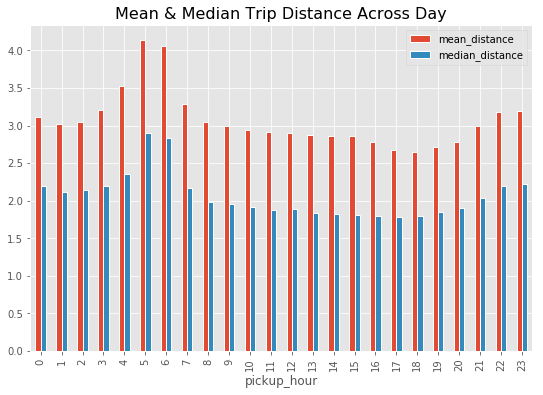

In [21]:
#Plot to show mean and median Trip Distance Across Day
dist_hour.plot.bar(edgecolor='white', linewidth=1)
plt.title('Mean & Median Trip Distance Across Day', fontsize=16)
plt.show()

#### NYC Airport Area
There are three main airports in New York City:
* LaGuardia Airport(LGA) (Lat: 40.7769, Long: -73.8740)
* John F. Kennedy International Airport(JFK) (Lat: 40.6413, Long: 73.7781) 
* Newark Liberty International Airport(EWR) (Lat: 40.6895, Long: 74.1745)

According to the data dictionary, I noticed the RateCodeID indicating "The final rate code in effect at the end of the trip". And I identified JFK(2) and Newark(3) from this field. Therefore, I'd like to use this to group the JFK and Newark airport trips. 

However, since the LGA group is not given by our data, we just manually define its area according to Google Map:
* LGA (40.768~40.78, -73.88~-73.856)

In [22]:
#Get trips that originate from or terminate at JFK or EWR. 
JFK_EWR_trips = green_temp[(green_temp.RateCodeID==2) | (green_temp.RateCodeID==3)]

#Get trips that originate from LaGuardia Airport area. 
LGA_start = green_temp[green_temp['Pickup_longitude'].between(-73.88, -73.856) &\
                     green_temp['Pickup_latitude'].between(40.768, 40.78)]

#Get trips that terminate at LaGuardia Airport area. 
LGA_end = green_temp[green_temp['Dropoff_longitude'].between(-73.88, -73.856) &\
                     green_temp['Dropoff_latitude'].between(40.768, 40.78)]

In [23]:
#Combine three aiports together and compute the total trips.  
air_trips = pd.concat([JFK_EWR_trips, LGA_start, LGA_end])
total_air_trips = air_trips.shape[0]
print("There are ", total_air_trips, " trips originate or terminate at the LaGuardia Airport.")

#Calculate the average fare of originate or terminate at the Airport. 
avg_air_fare = sum(air_trips.Fare_amount)/total_air_trips
print("The average airport trip fare is ", avg_air_fare)

There are  27821  trips originate or terminate at the LaGuardia Airport.
The average airport trip fare is  26.33715215125265


To discover other characteristics of these trips, we would like to compare them with the non-airport trips. 

In [24]:
#Get the non airport trips
non_air_trips = pd.concat([green_temp, air_trips]).drop_duplicates(keep=False)

In [25]:
#Compare the average trip distance between airport trips and non airport trips. 
a_avg_trip_dist = sum(air_trips.Trip_distance)/air_trips.shape[0]
na_avg_trip_dist = sum(non_air_trips.Trip_distance)/non_air_trips.shape[0]

#Compare the average fare between airport trips and non airport trips.
avg_non_air_fare = sum(non_air_trips.Fare_amount)/non_air_trips.shape[0]

#Compare the average tips between airport trips and non airport trips.
avg_air_tips = sum(air_trips.Tip_amount)/air_trips.shape[0]
avg_non_air_tips = sum(non_air_trips.Tip_amount)/non_air_trips.shape[0]

compare = pd.DataFrame(data={'Airport_trips':[a_avg_trip_dist, avg_air_fare, avg_air_tips], \
                            'Non_airport_trips':[na_avg_trip_dist, avg_non_air_fare, avg_non_air_tips]})
compare.rename(index = {0: "Average Trip Distance", 1:"Average Fare", 2:"Average Tips"},inplace = True) 
compare

,Airport_trips,Non_airport_trips
Average Trip Distance,6.979279,2.891833
Average Fare,26.337152,12.284209
Average Tips,3.314254,1.196819


From the statistics above, we have the following interesting discoveries:
1. The average trip distance of trips originate from or terminate at the airport is higher than the non-airport average trip distance.
2. The average fare amount for trips originate and terminate at the airport is higher than that for non-airport trips.
3. The average tip amount for trips originate and terminate at the airport are also higher than that for non-airport trips. It is probably because the airport trips are longer or the driver helped to carry the luggage. 

We would like further discover these three attributes by grouping with hours. 

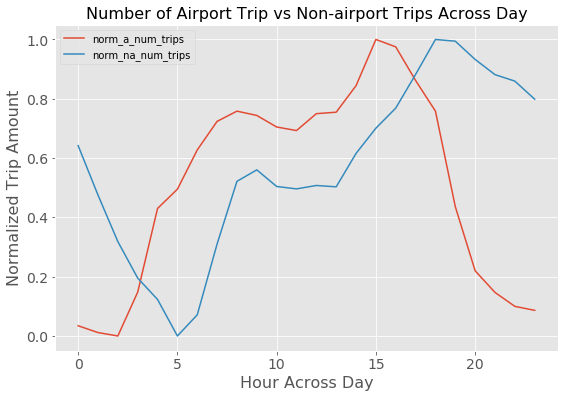

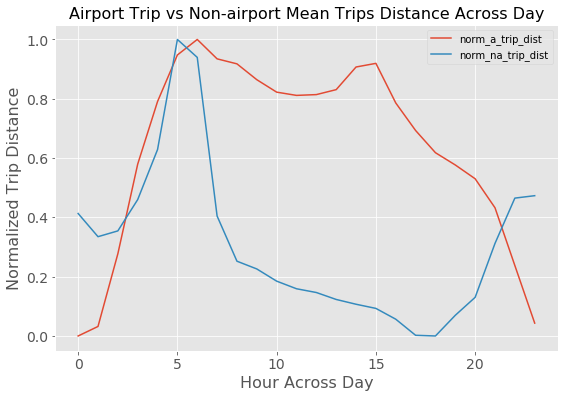

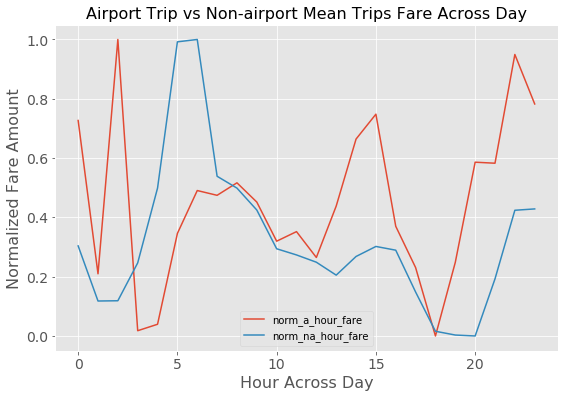

In [26]:
#function to normalize a column
def norm_col(col):
    # Create x, where x the 'scores' column's values as floats
    x = col.values.astype(float)

    # Create a minimum and maximum processor object
    min_max_scaler = preprocessing.MinMaxScaler()

    # Create an object to transform the data to fit minmax processor
    x_scaled = min_max_scaler.fit_transform(x)

    # Run the normalizer on the dataframe
    df_normalized = pd.DataFrame(x_scaled)
    
    return df_normalized

#Compare the number of trips between airport trips and non-airport trips across the day
na_num_trips = non_air_trips.pickup_hour.value_counts(sort=False)
norm_na_num_trips = norm_col(pd.DataFrame(na_num_trips).sort_index())

a_num_trips = air_trips.pickup_hour.value_counts(sort=False)
norm_a_num_trips = norm_col(pd.DataFrame(a_num_trips).sort_index())

norm_num_trips = pd.concat([norm_a_num_trips, norm_na_num_trips], axis=1)
norm_num_trips.columns = ["norm_a_num_trips", "norm_na_num_trips"]


#Compare the mean fares between airport trips and non-airport trips across the day
na_hour_fare = non_air_trips.groupby('pickup_hour')['Fare_amount'].describe()["mean"]
norm_na_hour_fare = norm_col(pd.DataFrame(na_hour_fare))

a_hour_fare = air_trips.groupby('pickup_hour')['Fare_amount'].describe()["mean"]
norm_a_hour_fare = norm_col(pd.DataFrame(a_hour_fare))

norm_hour_fare = pd.concat([norm_a_hour_fare, norm_na_hour_fare], axis=1)
norm_hour_fare.columns = ["norm_a_hour_fare", "norm_na_hour_fare"]

#Compare the mean trip distance between airport trips and non-airport trips across the day
na_trip_dist = non_air_trips.groupby('pickup_hour')['Trip_distance'].describe()["mean"]
norm_na_trip_dist = norm_col(pd.DataFrame(na_trip_dist))

a_trip_dist = air_trips.groupby('pickup_hour')['Trip_distance'].describe()["mean"]
norm_a_trip_dist = norm_col(pd.DataFrame(a_trip_dist))

norm_trip_dist = pd.concat([norm_a_trip_dist, norm_na_trip_dist], axis=1)
norm_trip_dist.columns = ["norm_a_trip_dist", "norm_na_trip_dist"]

#Draw the plots
norm_num_trips.plot.line()
plt.title('Number of Airport Trip vs Non-airport Trips Across Day', fontsize=16)
plt.xlabel('Hour Across Day', fontsize=16)
plt.ylabel('Normalized Trip Amount', fontsize=16)
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 
plt.show()

norm_trip_dist.plot.line()
plt.title('Airport Trip vs Non-airport Mean Trips Distance Across Day', fontsize=16)
plt.xlabel('Hour Across Day', fontsize=16)
plt.ylabel('Normalized Trip Distance', fontsize=16)
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 
plt.show()

norm_hour_fare.plot.line()
plt.title('Airport Trip vs Non-airport Mean Trips Fare Across Day', fontsize=16)
plt.xlabel('Hour Across Day', fontsize=16)
plt.ylabel('Normalized Fare Amount', fontsize=16)
plt.xticks(fontsize=14)  
plt.yticks(fontsize=14) 
plt.show()

#### Group fair amount of the trips by hour of the day, we have the following discoveries:<br>
For the number of trips:
1. The number of trips at airports peaks around 3PM while the rest peaks 2 hours later.
2. There is a shortage in airports riders at 2AM while the rest of NYC goes completely down 3 hours later 5AM.

For the trip distance:
1. The airport trips distance are much longer during the day time. One possible reasons could be travelers would generally live in the hotel close to the airport if their flight arrived at night, however, if their flight arrived during the day time, they would generally go directly to work or visit, which could be in the downtown Manhattan and far away from the airport. 

2. An interesting finding for the non-airport trip is that is the trip distance peaks during the morning rush hour, while bottomed around the evening rush hour. That's probably because people commute far from home to work, however, during the evening, there could be a lot of traffic in the center working area, and the taxi won't travel too far. 

For the trip fare:
1. The airport trips generally more expensive during the night time. 
2. The non-airport trips fare peaks at 6 in the morning, which is during the morning rush hour. 

<a id="Q4"></a>

### Question 4
• Build a derived variable for tip as a percentage of the total fare.

• Build a predictive model for tip as a percentage of the total fare. Use as much of the data as you like (or all of it). Provide an estimate of performance using an appropriate sample, and show your work.

#### Create the Tips Percentage variable

In [27]:
#Make a copy of the data
myData = data.copy()

In [28]:
#Build a derived variable for tip as a percentage of the total fare.
myData['tip_percent'] = myData['Tip_amount']/myData['Total_amount']
print("Check out tips percentage summary:\n", myData["tip_percent"].describe())

#Check if there are invalide values and remove, i.e. NA or percent greater than 1.
#There are NAs in the tip_percent, so we drop them.
print("--------------------------")
tip_percent_na = myData["tip_percent"].isnull().sum() 
print("There are ", tip_percent_na, " NA, so we drop them.")
myData = myData[myData["tip_percent"].notnull()]

print("--------------------------")
print((myData['tip_percent'] > 1).value_counts())
print("There are no values greater than 1 in tip_percent.")

Check out tips percentage summary:
 count    1.490754e+06
mean     6.653826e-02
std      8.875158e-02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      1.666667e-01
max      1.000000e+00
Name: tip_percent, dtype: float64
--------------------------
There are  4172  NA, so we drop them.
--------------------------
False    1490754
Name: tip_percent, dtype: int64
There are no values greater than 1 in tip_percent.


#### Build the Model
##### I. Data Processing
Before building the model, we will conduct a data cleaning to ensure we have a cleaned and valid data set for use. 

###### I.1Data Cleaning
1. Drop Ehail_fee as the 100% values are missing in it
10. Replace the NA for Trip_type with its median 1. 
1. Pick up and drop out latitude and longitude does not equal to 0 as we are in NYC.
3. Fare amount, MTA_tax amount, Tip amount, Extra amount, Toll amount, and Improvement surcharge amount charged for the trip should be greater than or equal to zero
11. Total amount charged for the trip is greater than or equal to 2.5 dollar (Assume 2.5 dollar as minimum amount charged for the trip)

In [29]:
myData.isnull().sum()

VendorID                       0
lpep_pickup_datetime           0
Lpep_dropoff_datetime          0
Store_and_fwd_flag             0
RateCodeID                     0
Pickup_longitude               0
Pickup_latitude                0
Dropoff_longitude              0
Dropoff_latitude               0
Passenger_count                0
Trip_distance                  0
Fare_amount                    0
Extra                          0
MTA_tax                        0
Tip_amount                     0
Tolls_amount                   0
Ehail_fee                1490754
improvement_surcharge          0
Total_amount                   0
Payment_type                   0
Trip_type                      4
tip_percent                    0
dtype: int64

In [30]:
#Drop Ehail_fee as the 100% values are missing in it
myData.drop('Ehail_fee', 1, inplace=True)

#Replace the NA for Trip_type with its median 1
myData['Trip_type '] = myData['Trip_type '].replace(np.NaN,1)

#Drop the data with lat and long equal to 0
myData = myData[(myData['Pickup_longitude'] !=0) & (myData['Pickup_latitude'] !=0) \
                  & (myData['Dropoff_longitude'] != 0) & (myData['Dropoff_latitude'] != 0)]

#Drop the negative charge
myData = myData[(myData['Fare_amount'] >= 0) & (myData['MTA_tax'] >= 0)\
                 & (myData['Tip_amount'] >= 0) & (myData['Tolls_amount'] >= 0) \
                 & (myData['improvement_surcharge'] >= 0) & (myData['Extra'] >= 0) ]

#Replace total amount lower than 2.5 with its median 11.76
rep_row = myData[(myData.Total_amount<2.5)].index
myData.loc[rep_row,'Total_amount'] = 11.76

print("After creating the response variable and cleaning the data, the data dimension changed from ", 
      data.shape, " to ", myData.shape)

After creating the response variable and cleaning the data, the data dimension changed from  (1494926, 21)  to  (1484997, 21)


###### I.2 Check categorical features
* Checkout and remove categorical features with too many levels or only one level

In [31]:
#Check out categorical attributes.
qualit_attr = ['VendorID','Store_and_fwd_flag','RateCodeID','Payment_type','Trip_type ']

for attr in qualit_attr:
    print('---------------------','\n',attr)
    print(myData[attr].value_counts())

--------------------- 
 VendorID
2    1164571
1     320426
Name: VendorID, dtype: int64
--------------------- 
 Store_and_fwd_flag
N    1476763
Y       8234
Name: Store_and_fwd_flag, dtype: int64
--------------------- 
 RateCodeID
1    1449252
5      29462
2       4253
3       1080
4        920
6         30
Name: RateCodeID, dtype: int64
--------------------- 
 Payment_type
2    777944
1    699611
3      3927
4      3444
5        71
Name: Payment_type, dtype: int64
--------------------- 
 Trip_type 
1.0    1455920
2.0      29077
Name: Trip_type , dtype: int64


All the categarical features looks good! Let's encode the Store_and_fwd_flag value with 0=N, 1=Y.

In [32]:
myData["Store_and_fwd_flag"] = myData["Store_and_fwd_flag"].astype('category')
myData["Store_and_fwd_flag"] = myData["Store_and_fwd_flag"].cat.codes
myData["Store_and_fwd_flag"].value_counts()

0    1476763
1       8234
Name: Store_and_fwd_flag, dtype: int64

#### II. Feature Engineering
In this step, I intuitively created new variables derived from current variables.

* Weekend: weather its weekday or weekend, int {0=week day, 1= weekend}.
* Pickup_hour: as we have crated in the previous step, hours across the day.
* Shift: derived from Pickup_hour, int {1=(7am to 3pm), 2=(3pm to 11pm) and 3=(11pm to 7am)}.
* Trip Duration.
* Manhattan: check whether the trip originate from Manhattan as which is considered the most busy and expensive area in NYC. int{0=outside Manhattan, 1= within Manhattan}

In [33]:
#Convert string to Datetime format
myData['lpep_pickup_datetime'] = pd.to_datetime(myData['lpep_pickup_datetime'])
myData['Lpep_dropoff_datetime'] = pd.to_datetime(myData['Lpep_dropoff_datetime'])

#Create the new categorical attribute Weekend, with 0=weekday, 1=weekend
print('---------------------','\n','Weekend')
myData['Weekend'] = (myData['lpep_pickup_datetime'].dt.weekday >= 5).astype(int)
print(myData['Weekend'].value_counts())

#Create a new attribute to record the pick up and drop off hour
myData['pickup_hour'] = myData.lpep_pickup_datetime.dt.hour
myData['dropoff_hour'] = myData.Lpep_dropoff_datetime.dt.hour

#Create a new categorical attribute shift with 1=(7am to 3pm), 2=(3pm to 11pm) and 3=(11pm to 7am)
print('---------------------','\n','Shift')
myData.loc[myData[(myData.pickup_hour>=7) & (myData.pickup_hour<15)].index,'Shift'] = 1
myData.loc[myData[(myData.pickup_hour>=15) & (myData.pickup_hour<23)].index,'Shift'] = 2
myData.loc[myData[myData.Shift.isnull()].index,'Shift'] = 3
print(myData['Shift'].value_counts())

#Create a new attribute to record the trip duration
myData['Trip_duration'] = ((myData.Lpep_dropoff_datetime-myData.lpep_pickup_datetime)\
                               .apply(lambda x:x.total_seconds()/60.))

#Creat a new attribute to record the trip average speed in mph. 
myData['Speed_mph'] = myData["Trip_distance"]/(myData['Trip_duration']/60)
speed_meadian = myData['Speed_mph'].median()
#Check out possible NA ans infinity value, and replace them with the median 11.77
index_na = myData[(myData['Speed_mph'].isnull()) | (myData['Speed_mph']>240)].index
myData.loc[index_na,'Speed_mph'] = speed_meadian

#Create the new categorical attribute Tip, with 0 = No Tip, 1 = with Tip. 
print('---------------------','\n','Tip')
myData.loc[myData[(myData.Tip_amount==0)].index,'Tip'] = 0
myData.loc[myData[(myData.Tip_amount!=0)].index,'Tip'] = 1
print(myData['Tip'].value_counts())

--------------------- 
 Weekend
0    1007514
1     477483
Name: Weekend, dtype: int64
--------------------- 
 Shift
2.0    692562
1.0    455493
3.0    336942
Name: Shift, dtype: int64
--------------------- 
 Tip
0.0    883154
1.0    601843
Name: Tip, dtype: int64


In [34]:
#Create a new feature to check if a trip originated in Manhattan.
# We manully collected bounding box points of Manhattan from Google Map. 
manhattan = [(40.796937, -73.949503),(40.787945, -73.955822),(40.782772, -73.943575),
              (40.794715, -73.929801),(40.811261, -73.934153),(40.835371, -73.934515),
              (40.868910, -73.911145),(40.872719, -73.910765),(40.878252, -73.926350),
              (40.850557, -73.947262),(40.836225, -73.949899),(40.806050, -73.971255)]
poi = Polygon(manhattan)
def is_within_bbox(loc,poi=poi):
    return 1*(Point(loc).within(poi))

myData['Manhattan'] = myData[['Pickup_latitude','Pickup_longitude']].apply(lambda r:is_within_bbox((r[0],r[1])),axis=1)
print('---------------------','\n','Manhattan')
print(myData['Manhattan'].value_counts())

--------------------- 
 Manhattan
0    1076039
1     408958
Name: Manhattan, dtype: int64


Checkout NA our dataset again for the new created features. 

In [35]:
myData.isnull().sum()

VendorID                 0
lpep_pickup_datetime     0
Lpep_dropoff_datetime    0
Store_and_fwd_flag       0
RateCodeID               0
Pickup_longitude         0
Pickup_latitude          0
Dropoff_longitude        0
Dropoff_latitude         0
Passenger_count          0
Trip_distance            0
Fare_amount              0
Extra                    0
MTA_tax                  0
Tip_amount               0
Tolls_amount             0
improvement_surcharge    0
Total_amount             0
Payment_type             0
Trip_type                0
tip_percent              0
Weekend                  0
pickup_hour              0
dropoff_hour             0
Shift                    0
Trip_duration            0
Speed_mph                0
Tip                      0
Manhattan                0
dtype: int64

#### III. Feature Selection
Now that we have generated the new features along with so many features already exist, we'd like to to find important features to use in our model. The following four methods (along with their package) will be conduct to to perform this step:
* Manually Selection: Remove lpep_pickup_datetime and Lpep_dropoff_datetime, since we already grouped the pick up and drop off time with pickup_hour and dropoff_hour; Drop either Tip_amount or Total_amount, as it would meaningless to predict the tip percentage if we have already know both of the variables, so in this case, we choose to drop tip amount.   
* Collinear Features (with build in package feature_selector using Pearson Correlation)
* Feature Importance (RandomForestClassifier)

In [36]:
#Manually drop features
myData.drop('lpep_pickup_datetime', 1, inplace=True, errors='ignore')
myData.drop('Lpep_dropoff_datetime', 1, inplace=True, errors='ignore')
myData.drop('Tip_amount', 1, inplace=True, errors='ignore')

In [37]:
#Let's begin with spliting our dataset into train and test sets. 
X = myData.loc[:, myData.columns != 'tip_percent']
y = myData["tip_percent"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [38]:
# Features are in train and labels are in train_labels
fs = FeatureSelector(data = X_train, labels = y_train)
#check out for collinearity
fs.identify_collinear(correlation_threshold = 0.9)

5 features with a correlation magnitude greater than 0.90.



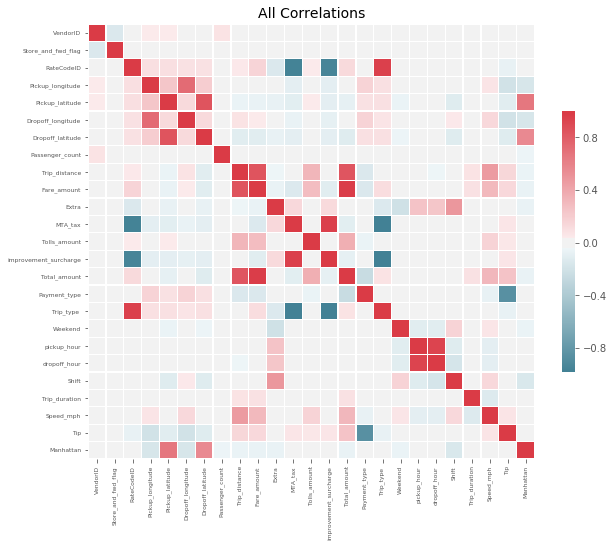

In [39]:
fs.plot_collinear(plot_all = True)

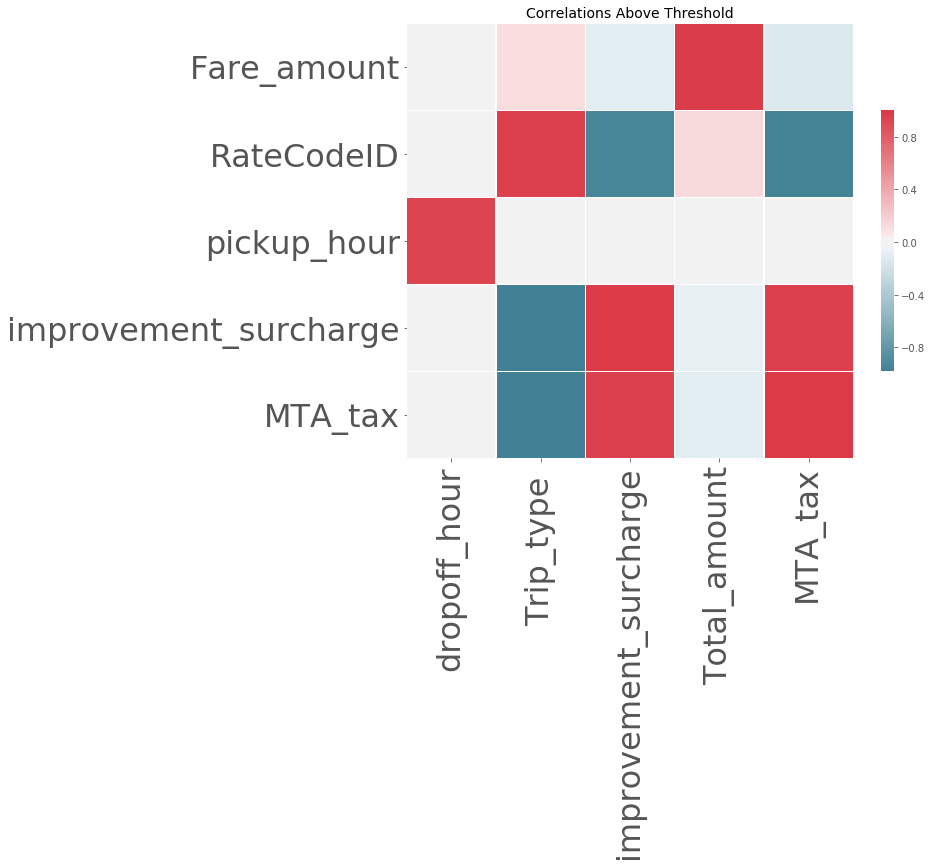

In [51]:
fs.plot_collinear()

In [41]:
# dataframe of collinear features
fs.record_collinear

,drop_feature,corr_feature,corr_value
0,MTA_tax,RateCodeID,-0.964828
1,improvement_surcharge,RateCodeID,-0.942370
2,improvement_surcharge,MTA_tax,0.956746
3,Total_amount,Fare_amount,0.976060
4,Trip_type,RateCodeID,0.958356
5,Trip_type,MTA_tax,-0.973654
6,Trip_type,improvement_surcharge,-0.980830
7,dropoff_hour,pickup_hour,0.933984


In [42]:
# list of collinear features to remove
collinear_features = fs.ops['collinear']
collinear_features

['MTA_tax',
 'improvement_surcharge',
 'Total_amount',
 'Trip_type ',
 'dropoff_hour']

To deal with the collinearity, we will simply drop the those features from our data, except the Total_amount, because we want to keep it for the next step for further check. 

In [43]:
myData.drop('MTA_tax', 1, inplace=True, errors='ignore')
myData.drop('improvement_surcharge', 1, inplace=True, errors='ignore')
myData.drop('Trip_type', 1, inplace=True, errors='ignore')
myData.drop('dropoff_hour', 1, inplace=True, errors='ignore')

In [44]:
#To save time, we will use only a part of the training data.
sample = myData.sample(frac=0.01, random_state = 2)

X_sample = sample.loc[:, sample.columns != 'tip_percent']
y_sample = sample["tip_percent"]

X_sample_train, X_sample_test, y_sample_train, y_sample_test = \
train_test_split(X_sample, y_sample, test_size=0.25, random_state=0)

#Encode response type
lab_enc = preprocessing.LabelEncoder()
y_sample_train = lab_enc.fit_transform(y_sample_train)
y_sample_test = lab_enc.fit_transform(y_sample_test)

Use Random Forest Classifier to select important features. 

The Accuracy of this model is  0.596014004847832


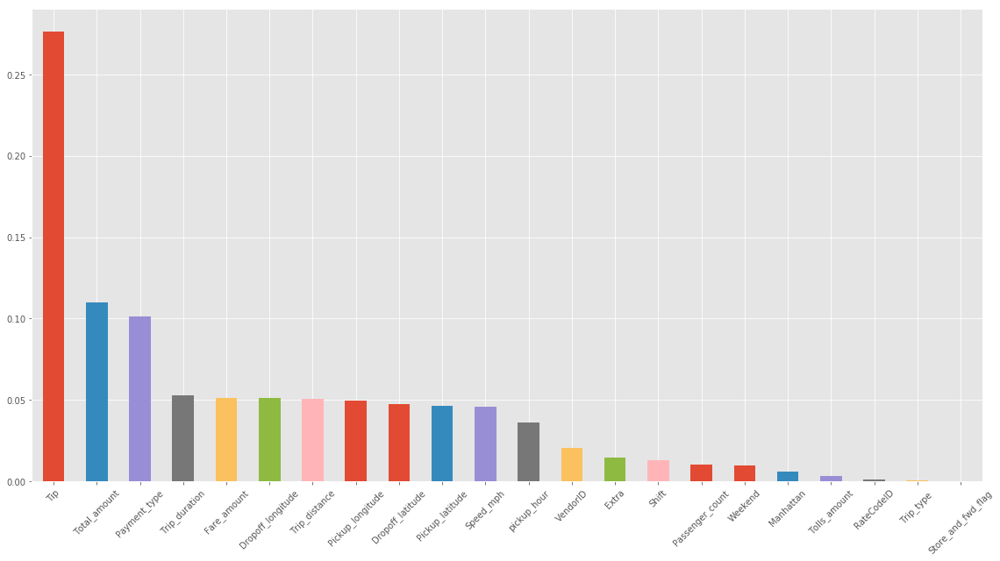

In [46]:
clf = RandomForestClassifier(random_state = 0,n_estimators=100, n_jobs = -1)
clf.fit(X_sample_train, y_sample_train)
y_pred_RandomForestClassifier = clf.predict(X_sample_test)

y_pred_RandomForestClassifier = clf.predict(X_sample_test)
#Get Accuracy Score
score = accuracy_score(y_pred_RandomForestClassifier,y_sample_test)
print("The Accuracy of this model is ", score)

global importances
# Get the feature importances
importances = []
importances = clf.feature_importances_

# Convert the importances into one-dimensional 1darray with corresponding df column names as axis labels
f_importances = pd.Series(importances, X_sample_train.columns)

# Sort the array in descending order of the importances
f_importances.sort_values(ascending=False, inplace=True)

# Make the bar Plot from f_importances 
f_importances.plot(x='Features', y='Importance', kind='bar', figsize=(16,9), rot=45, fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

After the above feature importance graph, we decided to drop the last four features (Trip_type, Store_and_fwd_flag, RateCodeID, Tolls_amount), and keep the followings as important features to train and optimized the regression model:

* Tip (categorical)
* Total_amount(continuous)
* Payment_type (categorical)
* Fare_amount (continuous)
* Trip_duration (continuous)
* Trip_distance (continuous) 
* Speed_mph (continuous)
* pickup_hour (continuous)
* Extra (continuous) 
* VendorID (categorical)                         
* Passenger_count (continuous)        
* Shift (categorical)
* Weekend (categorical)
* Manhattan (categorical)

#### IV. Build the Final Model
After comparing several Machine Learning methods, I choose to use Random Forest in the end,  with its advantage of being flexible, having high accuracy, and being able to handle both numerical and categorical data, and overcoming the problem of overfitting.

In [47]:
predictors = ['Total_amount', 
            'Tip',
            'Payment_type',
            'Fare_amount',
            'Trip_duration',
            'Pickup_longitude',
            'Pickup_latitude', 
            'Dropoff_longitude', 
            'Dropoff_latitude',
            'Trip_distance',
            'Speed_mph',
            'pickup_hour',
            'Extra', 
            'VendorID',
            'Passenger_count',
            'Shift',
            'Weekend',
            'Manhattan']

X_sample_train = X_sample_train[predictors]
X_sample_test = X_sample_test[predictors]

In [48]:
# Build the final model
clf = RandomForestClassifier(random_state = 10,n_estimators=100, max_features = 0.5, 
                             min_samples_leaf = 50, n_jobs = -1, oob_score = True)
clf.fit(X_sample_train, y_sample_train)
y_pred_RandomForestClassifier = clf.predict(X_sample_test)
#Get Accuracy Score
score = accuracy_score(y_pred_RandomForestClassifier,y_sample_test)
print("The Test Accuracy of this model is ", score)

The Test Accuracy of this model is  0.596014004847832


<a id="Q5"></a>

### Problem 5
* Option B: Visualization
* Can you build a visualization (interactive or static) of the trip data that helps us understand intra- vs. inter-borough traffic? What story does it tell about how New Yorkers use their green taxis?

In this part, I will draw two maps with pickup points and dropoff points. Together, they will give us a clear picture of how people use the green taxi and its traffic in NYC. 

Text(0.5,1,'Green Taxi Pick Up Map 2015-09')

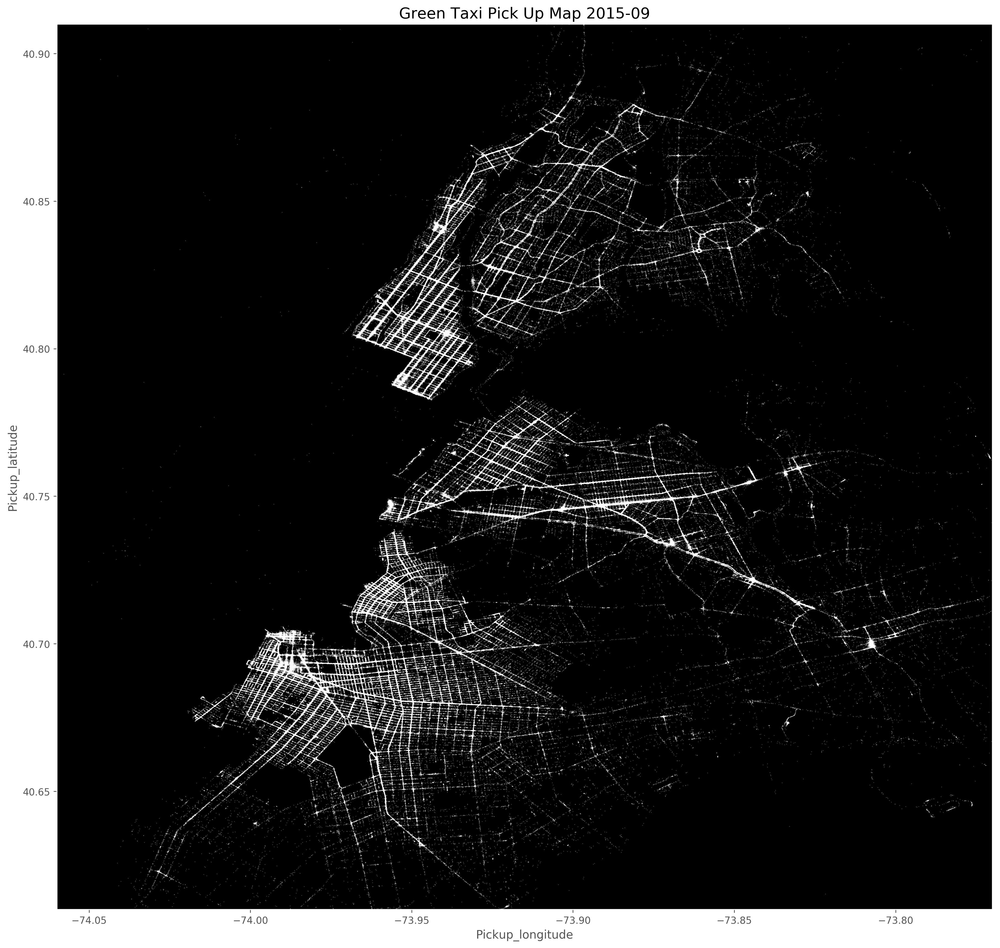

In [21]:
new_style = {'grid': False} #Remove grid  
matplotlib.rc('axes', **new_style)  
rcParams['figure.figsize'] = (17.5, 17) #Size of figure  
rcParams['figure.dpi'] = 250

Pickup_map=data.plot(kind='scatter', x='Pickup_longitude', y='Pickup_latitude', 
            color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
Pickup_map.set_facecolor('black') #Background Color
plt.title('Green Taxi Pick Up Map 2015-09', fontsize=16)

The map above plotted with green cab pick up points shows us an overview of NYC green taxi traffic and how it operate inter and intra NYC. Referred the NYC map (from Google Map), The followings are the main features discovered:
* Four clusters (boroughs) are shown on the graph: the upper two clusters (Upper Manhattan Borough & Bronx Borough) divided by the Harlem River, the middle cluster of Queens Borough, and the bottom cluster of Brooklyn Borough. 

* The midtown and downtown area of Manhattan disappeared, because the green cab is not allowed to pick up passengers inside of the densely populated areas of Manhattan.

* There are many bridges connecting each boroughs, although not obvious from the plot. Becuase I believe most of time, the green cab would not be able to stop and pick up passenger on the bridges.

* The upper Manhattan and northwest part of Brooklyn (Brooklyn Heights & Dumbo) are the densest area of using green cab. The Brooklyn Heights & Dumbo are popular visiting sites and connected with Manhattan with Brooklyn Bridge and Manhattan Bridge.

* A dense traffic road runs from northwest to southeast through the Queens area. It outlines the Queens Boulevard, a part of New York State Route 25th. Queens Blvd is a major thoroughfare in the New York City borough of Queens connecting Midtown Manhattan, via the Queensboro Bridge. 

Text(0.5,1,'Green Taxi Drop Off Map 2015-09')

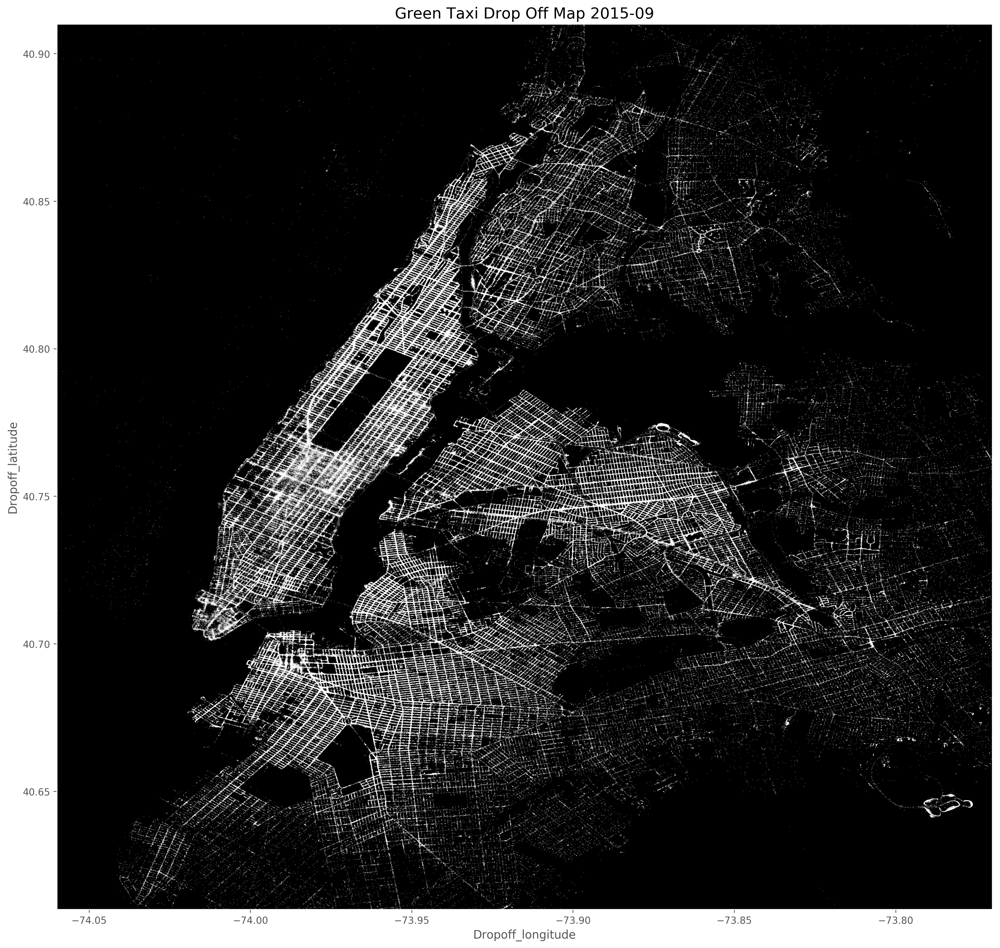

In [22]:
new_style = {'grid': False} #Remove grid  
matplotlib.rc('axes', **new_style)  
rcParams['figure.figsize'] = (17.5, 17) #Size of figure  
rcParams['figure.dpi'] = 250

Dropoff_map=data.plot(kind='scatter', x='Dropoff_longitude', y='Dropoff_latitude', color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
Dropoff_map.set_facecolor('black') #Background Color
plt.title('Green Taxi Drop Off Map 2015-09', fontsize=16)

Compared with the constrain of picking up passengers outside the busy Manhattan, the green cab is allowed to drop off passengers anywhere in the New York City. Therefore, the drop off map gives us a broader view of traffic in New York City. 

* The brightest area is still the Manhattan, especially the Midtown Manhattan. It means Midtown Manhattan is the place with the dentist traffic and the most popular area for New Yorkers or visitors taking the green cab to. Midtown Manhattan is the largest central business district in the world, and this area hosts commuters and residents working in its offices, hotels, and retail establishments, tourists and students. So there is no doubt to be the most popular destination for New Yorkers taking the green cab. In addition, since the middle town is the area embraces the most poplar visiting sites, such as Time Square, Empire State Building, Rockefeller Center, and the Broadway, I would guess a great number of the passengers can be visitors. 

* There is a small cluster at the southeast area, which is the JFK airport. It indicates green cab can be a popular vehicle for New Yorkers travel to the airport.

* The large dark rectangle in Manhattan is the central park, where has little traffic go through. 

### Comment
If have more time, I will
* Carefully conduct the data cleaning. Instead of simply dropping the negative values for the various fee charged, I would analyze each variable and prop out distinctive solving method for each variable. 

* Draw the visulization map showing the tip/total_amount with different colors base on the pick up and drop off lat and long. And based on this map, I will group NYC into several specific areas for prediction. 

* Solve multicolinearity problem with Lasso and Ridge, rather than directly manually delete the features. 

* Choose several models (Clusters and Regression) and combine them together to make prediction. 

* Optimize the model with cross-validation and many other more detailed way.

* Use the whole dataset for training and test. The result should be much better than just using the sample. 